### Here we transform the NetCDF file into standard lists for further analyses 
#### We regrid the spatial resolution onto 0.5°×0.5° for high-resolution geomapping
#### Historical O${_3}$ simulations 1850-2014

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

import iris

#### Prescribe the key parameters: 
##### i) target years for analysis (e.g. Y = 1 for most recent year 2014)
##### ii) ideal spatial resolutions (e.g. 180×90 grids)
###### These parameters are prescribed arbitrarily

In [2]:
Y = 1
lon = 720
lat = 360

#### Define the 0.5°×0.5° new spatial resolution for regridding (centred coordinates)

In [3]:
res_lon = 360/lon
res_lat = 180/lat
sample_points = [('longitude', np.linspace(0+res_lon/2, 360-res_lon/2, lon)),
                 ('latitude',  np.linspace(-90+res_lat/2, 90-res_lat/2, lat))]

In [4]:
sample_points

[('longitude',
  array([2.5000e-01, 7.5000e-01, 1.2500e+00, 1.7500e+00, 2.2500e+00,
         2.7500e+00, 3.2500e+00, 3.7500e+00, 4.2500e+00, 4.7500e+00,
         5.2500e+00, 5.7500e+00, 6.2500e+00, 6.7500e+00, 7.2500e+00,
         7.7500e+00, 8.2500e+00, 8.7500e+00, 9.2500e+00, 9.7500e+00,
         1.0250e+01, 1.0750e+01, 1.1250e+01, 1.1750e+01, 1.2250e+01,
         1.2750e+01, 1.3250e+01, 1.3750e+01, 1.4250e+01, 1.4750e+01,
         1.5250e+01, 1.5750e+01, 1.6250e+01, 1.6750e+01, 1.7250e+01,
         1.7750e+01, 1.8250e+01, 1.8750e+01, 1.9250e+01, 1.9750e+01,
         2.0250e+01, 2.0750e+01, 2.1250e+01, 2.1750e+01, 2.2250e+01,
         2.2750e+01, 2.3250e+01, 2.3750e+01, 2.4250e+01, 2.4750e+01,
         2.5250e+01, 2.5750e+01, 2.6250e+01, 2.6750e+01, 2.7250e+01,
         2.7750e+01, 2.8250e+01, 2.8750e+01, 2.9250e+01, 2.9750e+01,
         3.0250e+01, 3.0750e+01, 3.1250e+01, 3.1750e+01, 3.2250e+01,
         3.2750e+01, 3.3250e+01, 3.3750e+01, 3.4250e+01, 3.4750e+01,
         3.5250e+01

#### Define the longitude-latitude-temporal sequence list

In [5]:
t = Y*12 ## Y years correspond to 12Y months 

lon_range = np.linspace(0+res_lon/2, 360-res_lon/2, lon)
lat_range = np.linspace(-90+res_lat/2, 90-res_lat/2, lat) 
t_range   = np.linspace(1, t, t) 
lat_mesh, t_mesh, lon_mesh = np.meshgrid(lat_range, t_range, lon_range) 

t_grid   = t_mesh.reshape(t*lon*lat, 1)
lon_grid = lon_mesh.reshape(t*lon*lat, 1)
lat_grid = lat_mesh.reshape(t*lon*lat, 1)

dataset = pd.DataFrame(lon_grid, columns = ['longitude'])
dataset['latitude'] = lat_grid
dataset['t'] = t_grid
dataset['loc'] = dataset['longitude']*1000+dataset['latitude']
dataset

,longitude,latitude,t,loc
0,0.25,-89.75,1.0,160.25
1,0.75,-89.75,1.0,660.25
2,1.25,-89.75,1.0,1160.25
3,1.75,-89.75,1.0,1660.25
4,2.25,-89.75,1.0,2160.25
...,...,...,...,...
3110395,357.75,89.75,12.0,357839.75
3110396,358.25,89.75,12.0,358339.75
3110397,358.75,89.75,12.0,358839.75
3110398,359.25,89.75,12.0,359339.75


#### 1.1. Import surface/ambient O${_3}$

In [6]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/o3_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'o3')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
o3 = values.reshape(t*lon*lat,1)
dataset['o3'] = o3

#### 1.2. Import surface/ambient O${_3}$ production rate 

In [7]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/o3prod_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'o3prod')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
o3prod = values.reshape(t*lon*lat,1)
dataset['o3prod'] = o3prod

#### 1.3. Import surface/ambient O${_3}$ loss rate

In [8]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/o3loss_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'o3loss')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
o3loss = values.reshape(t*lon*lat,1)
dataset['o3loss'] = o3loss

#### 2.1. Import total NO${_X}$ emission 

In [9]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/eminox_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_195001-201412.nc', 'eminox')
time_seq, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
nox = values.reshape(t*lon*lat,1)
dataset['eminox'] = nox

#### 2.2. Import total VOC emission

In [10]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/emivoc_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_195001-201412.nc', 'emivoc')
time_seq, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
voc = values.reshape(t*lon*lat,1)
dataset['emivoc'] = voc

#### 3.1. Import near-surface air temperature

In [11]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/tas_Amon_UKESM1-0-LL_historical_r1i1p1f2_gn_195001-201412.nc', 'tas')
time_seq, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
tas = values.reshape(t*lon*lat,1)
dataset['tas'] = tas

#### 3.2. Import ambient air humidity

In [12]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/hus_Amon_UKESM1-0-LL_historical_r1i1p1f2_gn_195001-201412.nc', 'hus')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,:,:,:]
data = data.collapsed('air_pressure', iris.analysis.MAX)
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
hus = values.reshape(t*lon*lat,1)
dataset['hus'] = hus

#### 3.3. Import aerosol optical depth at 550 nm

In [13]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/abs550aer_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_195001-201412.nc', 'abs550aer')
time_seq, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
aod = values.reshape(t*lon*lat,1)
dataset['aod'] = aod

#### 3.4. Import planetary boundary layer height

In [14]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/bldep_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_195001-201412.nc', 'bldep')
time_seq, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
pbl = values.reshape(t*lon*lat,1)
dataset['bldep'] = pbl

#### 3.5. Import eastward wind speed

In [15]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/ua_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'ua')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
ua = values.reshape(t*lon*lat,1)
dataset['ua'] = ua

#### 3.6. Import northward wind speed

In [16]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/va_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'va')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
va = values.reshape(t*lon*lat,1)
dataset['va'] = va

#### 3.7. Import the surface air pressure

In [17]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/ps_AERmon_UKESM1-1-LL_historical_r1i1p1f2_gn_195001-201412.nc', 'ps')
time_seq, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
ps = values.reshape(t*lon*lat,1)
dataset['ps'] = ps

#### 4.1. Import NO${_2}$ photolysis rate

In [20]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/jno2_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'jno2')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
jno2 = values.reshape(t*lon*lat,1)
dataset['jno2'] = jno2

#### 4.2. Import O${_3}$→O(${^1}$D) photolysis rate

In [21]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/photo1d_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'photo1d')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
jo3 = values.reshape(t*lon*lat,1)
dataset['photo1d'] = jo3

#### 4.3. Import CH${_4}$ reaction loss rate

In [22]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/lossch4_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'lossch4')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
lossch4 = values.reshape(t*lon*lat,1)
dataset['lossch4'] = lossch4

#### 4.4. Import CO reaction loss rate

In [23]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/lossco_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'lossco')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
lossco = values.reshape(t*lon*lat,1)
dataset['lossco'] = lossco

#### 5.1. Import NO${_2}$ concentration

In [24]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/no2_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'no2')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
no2 = values.reshape(t*lon*lat,1)
dataset['no2'] = no2

#### 5.2. Import NO concentration

In [25]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/no_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'no')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
no = values.reshape(t*lon*lat,1)
dataset['no'] = no

#### 5.3. Import OH radical concentration

In [26]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/oh_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'oh')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
oh = values.reshape(t*lon*lat,1)
dataset['oh'] = oh

#### 5.4. Import H${_2}$O concentration

In [27]:
data = iris.load_cube('D:/Research/CMIP6/NCAR/CESM2-WACCM-FV2/historical/h2o_AERmon_CESM2-WACCM-FV2_historical_r1i1p1f1_gn_200001-201412.nc', 'h2o')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,69,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
h2o = values.reshape(t*lon*lat,1)
dataset['h2o'] = h2o

#### 5.5. Import PAN reservoir concentration

In [28]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/pan_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'pan')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
pan = values.reshape(t*lon*lat,1)
dataset['pan'] = pan

#### 5.6. Import HNO${_3}$ reservoir concentration

In [29]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/hno3_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'hno3')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
hno3 = values.reshape(t*lon*lat,1)
dataset['hno3'] = hno3

#### 5.7. Import CO concentration

In [30]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/co_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'co')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
co = values.reshape(t*lon*lat,1)
dataset['co'] = co

#### 5.8. Import HCHO concentration

In [31]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/hcho_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'hcho')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
hcho = values.reshape(t*lon*lat,1)
dataset['hcho'] = hcho

#### 5.9. Import CH${_4}$ concentration

In [32]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/ch4_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'ch4')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
ch4 = values.reshape(t*lon*lat,1)
dataset['ch4'] = ch4

#### 5.10. Import C${_2}$H${_6}$ concentration

In [33]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/c2h6_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'c2h6')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
c2h6 = values.reshape(t*lon*lat,1)
dataset['c2h6'] = c2h6

#### 5.11. Import C${_3}$H${_8}$ concentration

In [34]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/c3h8_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'c3h8')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
c3h8 = values.reshape(t*lon*lat,1)
dataset['c3h8'] = c3h8

#### 5.12. Import C${_5}$H${_8}$ isoprene concentration

In [35]:
data = iris.load_cube('D:/Research/CMIP6/MOHC/historical/isop_AERmon_UKESM1-0-LL_historical_r1i1p1f2_gn_200001-201412.nc', 'isop')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
isop = values.reshape(t*lon*lat,1)
dataset['isop'] = isop

#### 6.1. Import CH${_3}$O${_2}$ radical concentration

In [38]:
data = iris.load_cube('D:/Research/ozone-budget/bc179_CH3O2_2010-2014.nc', 'mass_fraction_of_methyl_peroxy_radical_in_air')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
ch3o2 = values.reshape(t*lon*lat,1)
dataset['ch3o2_mod'] = ch3o2

#### 6.2. Import HO${_2}$ radical concentration

In [39]:
data = iris.load_cube('D:/Research/ozone-budget/bc179_HO2_2010-2014.nc', 'mass_fraction_of_hydroperoxyl_radical_in_air')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
ho2 = values.reshape(t*lon*lat,1)
dataset['ho2_mod'] = ho2

#### 6.3. Import O(${^1}$D) radical concentration

In [40]:
data = iris.load_cube('D:/Research/ozone-budget/bc179_O1D_2010-2014.nc', 'mass_fraction_of_o1d_in_air')
time_seq, layer, latitude, longitude = data.shape
data = data[time_seq-t:time_seq,0,:,:]
data = data.interpolate(sample_points, iris.analysis.Linear())
values = np.array(data.data)
o1d = values.reshape(t*lon*lat,1)
dataset['o1d_mod'] = o1d

#### We should convert 0-360° into 180°W-180°E scheme

In [41]:
dataset_pt1 = dataset[dataset['longitude'] < 180]
dataset_pt2 = dataset[dataset['longitude'] >= 180]
dataset_pt2['longitude'] = dataset_pt2['longitude']-360
dataset_adj = pd.concat([dataset_pt1, dataset_pt2], ignore_index=True)
dataset_adj

,longitude,latitude,t,loc,o3,o3prod,o3loss,eminox,emivoc,tas,...,hno3,co,hcho,ch4,c2h6,c3h8,isop,ch3o2_mod,ho2_mod,o1d_mod
0,0.25,-89.75,1.0,160.25,1.452797e-08,7.867945e-14,9.046455e-14,0.000000e+00,0.000000e+00,248.228928,...,3.843822e-12,4.124111e-08,1.957105e-11,0.000002,1.073096e-09,3.005076e-11,1.449166e-26,2.699120e-12,4.214414e-12,3.569033e-22
1,0.75,-89.75,1.0,660.25,1.452924e-08,7.864571e-14,9.042632e-14,0.000000e+00,0.000000e+00,248.234100,...,3.840549e-12,4.124122e-08,1.956535e-11,0.000002,1.073094e-09,3.004989e-11,1.423354e-26,2.699614e-12,4.214263e-12,3.567889e-22
2,1.25,-89.75,1.0,1160.25,1.453387e-08,7.866169e-14,9.045681e-14,0.000000e+00,0.000000e+00,248.242996,...,3.845680e-12,4.124133e-08,1.957391e-11,0.000002,1.073095e-09,3.004895e-11,1.407152e-26,2.700414e-12,4.214875e-12,3.568066e-22
3,1.75,-89.75,1.0,1660.25,1.454053e-08,7.870749e-14,9.052852e-14,0.000000e+00,0.000000e+00,248.254120,...,3.855855e-12,4.124143e-08,1.959102e-11,0.000002,1.073097e-09,3.004796e-11,1.396716e-26,2.701396e-12,4.215945e-12,3.569035e-22
4,2.25,-89.75,1.0,2160.25,1.454718e-08,7.875331e-14,9.060023e-14,0.000000e+00,0.000000e+00,248.265259,...,3.866029e-12,4.124153e-08,1.960813e-11,0.000002,1.073100e-09,3.004697e-11,1.386279e-26,2.702378e-12,4.217016e-12,3.570005e-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3110395,-2.25,89.75,12.0,357839.75,1.621541e-08,3.649463e-16,1.918938e-16,1.239357e-13,2.444437e-15,242.582077,...,1.885407e-10,8.999778e-08,1.391217e-11,0.000002,2.369334e-09,3.742865e-10,6.178701e-15,5.593346e-14,5.392361e-15,0.000000e+00
3110396,-1.75,89.75,12.0,358339.75,1.621581e-08,3.846478e-16,1.967400e-16,1.921138e-13,3.788097e-15,242.579269,...,1.885361e-10,8.999797e-08,1.391608e-11,0.000002,2.369362e-09,3.743148e-10,6.177331e-15,5.625231e-14,5.410102e-15,0.000000e+00
3110397,-1.25,89.75,12.0,358839.75,1.621621e-08,4.043494e-16,2.015861e-16,2.602919e-13,5.131757e-15,242.576462,...,1.885316e-10,8.999815e-08,1.391999e-11,0.000002,2.369391e-09,3.743430e-10,6.175962e-15,5.657117e-14,5.427844e-15,0.000000e+00
3110398,-0.75,89.75,12.0,359339.75,1.621423e-08,4.359465e-16,2.069088e-16,3.736637e-13,7.366098e-15,242.573486,...,1.885160e-10,8.999830e-08,1.391732e-11,0.000002,2.369430e-09,3.743790e-10,6.174583e-15,5.640556e-14,5.470570e-15,0.000000e+00


In [43]:
list(dataset_adj)

['longitude',
 'latitude',
 't',
 'loc',
 'o3',
 'o3prod',
 'o3loss',
 'eminox',
 'emivoc',
 'tas',
 'hus',
 'aod',
 'bldep',
 'ua',
 'va',
 'ps',
 'jno2',
 'photo1d',
 'lossch4',
 'lossco',
 'no2',
 'no',
 'oh',
 'h2o',
 'pan',
 'hno3',
 'co',
 'hcho',
 'ch4',
 'c2h6',
 'c3h8',
 'isop',
 'ch3o2_mod',
 'ho2_mod',
 'o1d_mod']

### Map the variables to ensure correct gridding

(-90.0, 90.0)

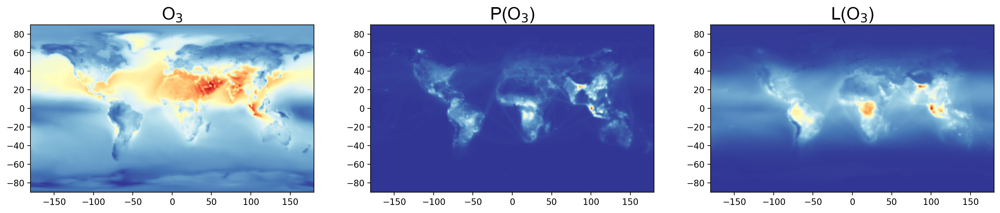

In [44]:
dataset_map = dataset_adj.groupby('loc').mean()
temp = dataset_map

plt.figure(num=None, figsize=(20, 3.5), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(1,3,1)
plt.title('O${_3}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o3'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,3,2)
plt.title('P(O${_3}$)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o3prod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,3,3)
plt.title('L(O${_3}$)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o3loss'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

(-90.0, 90.0)

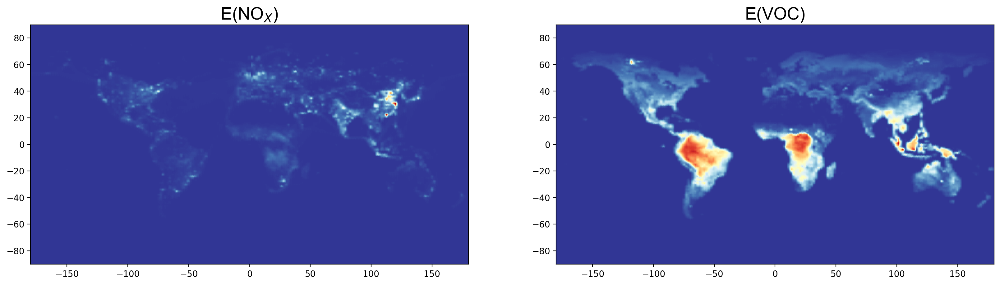

In [45]:
plt.figure(num=None, figsize=(20, 5), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(1,2,1)
plt.title('E(NO${_X}$)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['eminox'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,2,2)
plt.title('E(VOC)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['emivoc'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

(-90.0, 90.0)

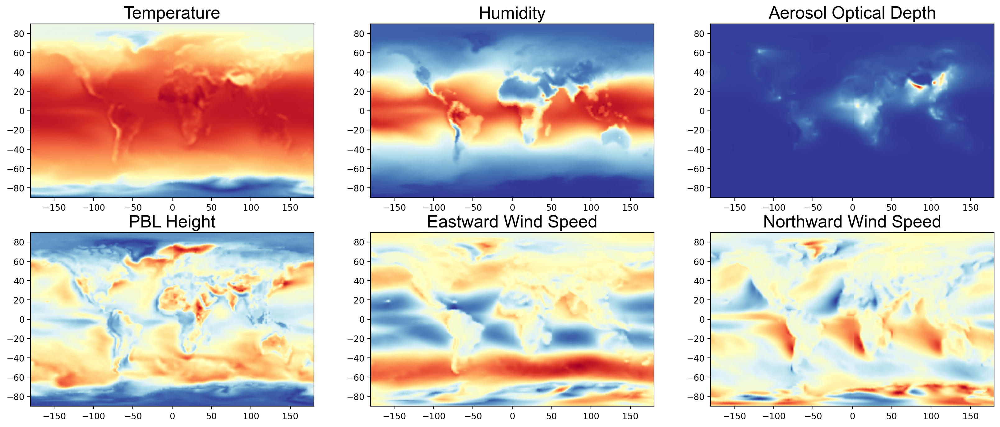

In [46]:
plt.figure(num=None, figsize=(20, 8), dpi=200, facecolor='w', edgecolor='k')

plt.subplot(2,3,1)
plt.title('Temperature', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['tas'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,2)
plt.title('Humidity', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['hus'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,3)
plt.title('Aerosol Optical Depth', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['aod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,4)
plt.title('PBL Height', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['bldep'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,5)
plt.title('Eastward Wind Speed', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ua'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,6)
plt.title('Northward Wind Speed', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['va'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

(-90.0, 90.0)

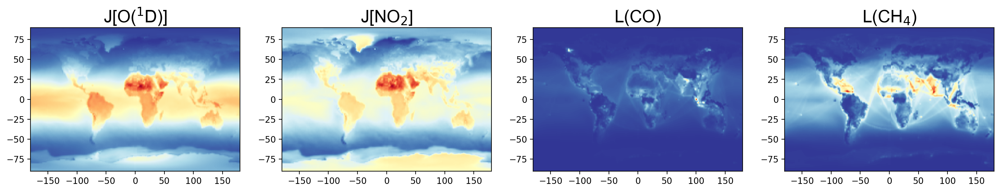

In [47]:
plt.figure(num=None, figsize=(20, 3), dpi=200, facecolor='w', edgecolor='k')

plt.subplot(1,4,1)
plt.title('J[O(${^1}$D)]', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['photo1d'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,4,2)
plt.title('J[NO${_2}$]', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['jno2'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,4,3)
plt.title('L(CO)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['lossco'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,4,4)
plt.title('L(CH${_4}$)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['lossch4'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

(-90.0, 90.0)

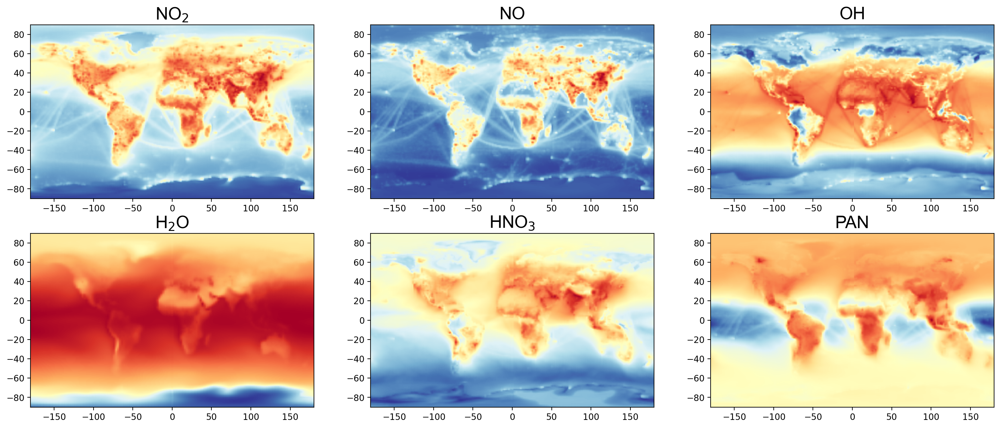

In [48]:
plt.figure(num=None, figsize=(20, 8), dpi=200, facecolor='w', edgecolor='k')

plt.subplot(2,3,1)
plt.title('NO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = np.log(temp['no2'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,2)
plt.title('NO', fontsize = 20, fontname = "Arial", color = "black")
z = np.log(temp['no'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,3)
plt.title('OH', fontsize = 20, fontname = "Arial", color = "black")
z = np.log(temp['oh'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,4)
plt.title('H${_2}$O', fontsize = 20, fontname = "Arial", color = "black")
z = np.log(temp['h2o'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,5)
plt.title('HNO${_3}$', fontsize = 20, fontname = "Arial", color = "black")
z = np.log(temp['hno3'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(2,3,6)
plt.title('PAN', fontsize = 20, fontname = "Arial", color = "black")
z = np.log(temp['pan'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

(-90.0, 90.0)

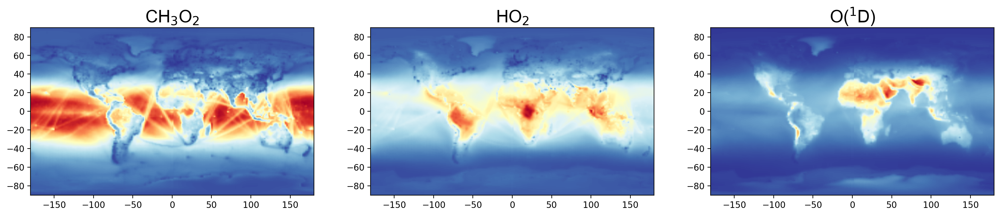

In [49]:
plt.figure(num=None, figsize=(20, 3.5), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(1,3,1)
plt.title('CH${_3}$O${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch3o2_mod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,3,2)
plt.title('HO${_2}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ho2_mod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,3,3)
plt.title('O(${^1}$D)', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['o1d_mod'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

(-90.0, 90.0)

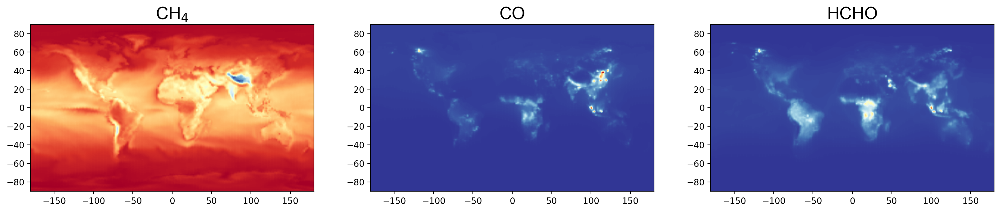

In [50]:
plt.figure(num=None, figsize=(20, 3.5), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(1,3,1)
plt.title('CH${_4}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['ch4'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,3,2)
plt.title('CO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['co'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,3,3)
plt.title('HCHO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['hcho'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

(-90.0, 90.0)

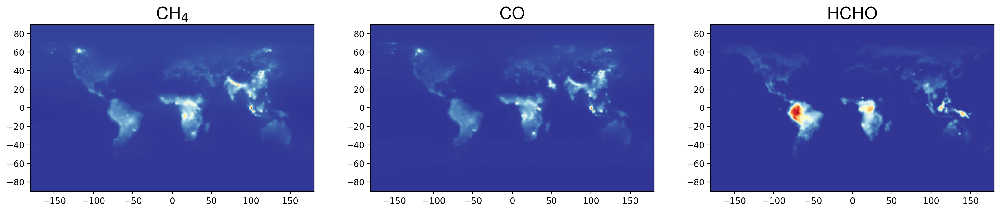

In [51]:
dataset_map = dataset_adj.groupby('loc').mean()
temp = dataset_map

plt.figure(num=None, figsize=(20, 3.5), dpi=200, facecolor='w', edgecolor='k')
cm = plt.cm.get_cmap('RdYlBu_r')
x = temp['longitude']
y = temp['latitude']

plt.subplot(1,3,1)
plt.title('CH${_4}$', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['c2h6'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,3,2)
plt.title('CO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['c3h8'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

plt.subplot(1,3,3)
plt.title('HCHO', fontsize = 20, fontname = "Arial", color = "black")
z = (temp['isop'])
sc = plt.scatter(x, y, c=z, marker="s", s=5, cmap=cm)
plt.xlim([-180, 180])
plt.ylim([-90, 90])
#plt.colorbar(fraction=0.02)

### Generate a cross-sectional average level for geomapping

In [52]:
dataset_map

,longitude,latitude,t,o3,o3prod,o3loss,eminox,emivoc,tas,hus,...,hno3,co,hcho,ch4,c2h6,c3h8,isop,ch3o2_mod,ho2_mod,o1d_mod
loc,,,,,,,,,,,,,,,,,,,,,
160.25,0.25,-89.75,6.5,1.689727e-08,2.556308e-14,3.325862e-14,0.000000e+00,0.000000e+00,226.484802,0.000296,...,5.480431e-12,5.224236e-08,1.263039e-11,0.000002,1.351859e-09,8.095267e-11,4.528891e-15,9.994408e-13,1.572732e-12,1.601886e-22
160.75,0.25,-89.25,6.5,1.681333e-08,2.579723e-14,3.318802e-14,0.000000e+00,0.000000e+00,226.660751,0.000289,...,5.278409e-12,5.224728e-08,1.227882e-11,0.000002,1.352198e-09,8.095447e-11,4.458081e-15,9.926054e-13,1.552528e-12,1.603598e-22
161.25,0.25,-88.75,6.5,1.672939e-08,2.603137e-14,3.311742e-14,0.000000e+00,0.000000e+00,226.836716,0.000282,...,5.076387e-12,5.225219e-08,1.192725e-11,0.000002,1.352537e-09,8.095628e-11,4.387269e-15,9.857700e-13,1.532323e-12,1.605309e-22
161.75,0.25,-88.25,6.5,1.664545e-08,2.626551e-14,3.304682e-14,0.000000e+00,0.000000e+00,227.012650,0.000275,...,4.874365e-12,5.225711e-08,1.157568e-11,0.000002,1.352876e-09,8.095808e-11,4.316459e-15,9.789346e-13,1.512118e-12,1.607021e-22
162.25,0.25,-87.75,6.5,1.670285e-08,2.667525e-14,3.363660e-14,0.000000e+00,0.000000e+00,227.263412,0.000272,...,4.809207e-12,5.225313e-08,1.162504e-11,0.000002,1.352836e-09,8.092534e-11,4.298906e-15,9.891324e-13,1.516329e-12,1.632555e-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359837.75,-0.25,87.75,6.5,2.154883e-08,1.773879e-13,1.194471e-13,1.149848e-13,2.160358e-15,256.358643,0.001472,...,1.151605e-10,8.816256e-08,4.242427e-11,0.000002,2.192836e-09,2.549974e-10,4.061695e-14,1.152605e-12,1.535653e-12,4.873258e-23
359838.25,-0.25,88.25,6.5,2.141639e-08,1.954195e-13,1.175016e-13,1.919456e-13,3.640590e-15,256.184326,0.001461,...,1.147983e-10,8.814782e-08,4.229829e-11,0.000002,2.193598e-09,2.548751e-10,4.446810e-14,1.116999e-12,1.522710e-12,4.790014e-23
359838.75,-0.25,88.75,6.5,2.141395e-08,2.066377e-13,1.174383e-13,3.166314e-13,6.112121e-15,256.108032,0.001461,...,1.146568e-10,8.812071e-08,4.222652e-11,0.000002,2.193267e-09,2.548291e-10,4.966031e-14,1.107213e-12,1.514018e-12,4.763124e-23


In [ ]:
dataset_map.to_csv('Extended Data Fig. 2 covariates-geo-mapping.csv', index=False)